1. categorical data is better(Charlsen Index)
2. ClaimsTruncated =>as logical or using it to delete claims => always related to the max claim number
3. Manually put into groups 
4. cut it roughly equal
5. unbalanced problem:(minimum support: how many sample objects?) overfitting? undersample the major group and what's the ratio to sample?
    * Or it is some groups are not important or enough to find some associated rules?
    * confidence>70% => something useful
6. How to find the threshold to find something common sence or something useful? Manually? => Depends on the business understanding
7. inspectDT()->data table, plot(rules, engine = "html"), ruleExplorer()("Awesome") => a great tool to visualize rules

# Data Preparation
## Data Selection

In [237]:
claims <- read.csv(file="Claims.csv")
members <- read.csv(file="Members.csv")
drugs <- read.csv(file="DrugCount.csv")
labs <- read.csv(file="LabCount.csv")

In [238]:
claims$MemberID <- as.factor(claims$MemberID)
claims <- subset(claims, 
                 select=c(MemberID, Year, Specialty, PlaceSvc, LengthOfStay, PrimaryConditionGroup, CharlsonIndex))
summary(claims)


    MemberID       Year                     Specialty     
 333728 :    130   Y1:865689   Internal          :672059  
 2397235:    130   Y2:898872   Laboratory        :653188  
 2550470:    130   Y3:904429   General Practice  :473655  
 2863794:    130               Surgery           :208217  
 3912423:    130               Diagnostic Imaging:207297  
 6132759:    130               Emergency         :126130  
 (Other):2668210               (Other)           :328444  
                PlaceSvc           LengthOfStay     PrimaryConditionGroup
 Office             :1542007             :2597392   MSC2a3  : 507277     
 Independent Lab    : 657750   1 day     :  56696   METAB3  : 320553     
 Urgent Care        : 199528   2 days    :   6485   ARTHSPIN: 288285     
 Outpatient Hospital: 121528   3 days    :   3246   NEUMENT : 171605     
 Inpatient Hospital :  85776   4 days    :   1473   RESPR4  : 138062     
 Ambulance          :  34766   1- 2 weeks:   1143   MISCHRT : 131047     
 (Other)  

In [239]:
members$MemberID <- as.factor(members$MemberID) 

#DRUG
levels(drugs$DrugCount) <- c(1,2,3,4,5,6,7)
drugs$DrugCount <- as.numeric(as.character(drugs$DrugCount))
drugs$MemberID <- as.factor(drugs$MemberID)
drugs <- aggregate(DrugCount~MemberID, drugs, sum)
members <- merge(members,data.frame(MemberID = drugs$MemberID,DrugCount = as.numeric(drugs$DrugCount)))

#LAB
levels(labs$LabCount) <- c(1,10,2,3,4,5,6,7,8,9)
labs$LabCount <- as.numeric(as.character(labs$LabCount))
labs$MemberID <- as.factor(labs$MemberID)
labs <- aggregate(LabCount~MemberID, labs, sum)
members <- merge(members,data.frame(MemberID = labs$MemberID,LabCount = as.numeric(labs$LabCount)))

#Gender WITH NA
members$Sex[members$Sex == ""] <- NA
members$Sex <- factor(members$Sex)

#LOS
levels(claims$LengthOfStay)[levels(claims$LengthOfStay)==""] <- "No Stay"

#Age WITH NA
members$AgeAtFirstClaim[members$AgeAtFirstClaim == ""] <- NA
members$AgeAtFirstClaim <- factor(members$AgeAtFirstClaim)

# add number of claims
n_claims <- table(claims$MemberID)

members <- merge(members, data.frame(MemberID=names(n_claims),
  claims=as.numeric(n_claims)))

summary(members)


    MemberID     AgeAtFirstClaim   Sex          DrugCount         LabCount     
 210    :    1   70-79  :12595   F   :29184   Min.   :  1.00   Min.   :  1.00  
 3197   :    1   60-69  : 9395   M   :21151   1st Qu.:  6.00   1st Qu.:  6.00  
 3713   :    1   40-49  : 7993   NA's:12936   Median : 18.00   Median : 13.00  
 3741   :    1   50-59  : 7491                Mean   : 34.28   Mean   : 18.59  
 3889   :    1   80+    : 6447                3rd Qu.: 47.00   3rd Qu.: 25.00  
 4048   :    1   (Other):15210                Max.   :252.00   Max.   :232.00  
 (Other):63265   NA's   : 4140                                                 
     claims     
 Min.   :  1.0  
 1st Qu.: 12.0  
 Median : 24.0  
 Mean   : 33.7  
 3rd Qu.: 47.0  
 Max.   :130.0  
                

In [339]:
allset <- merge(claims, members, by = "MemberID")
allset <- subset(allset, 
                 select=c(Year, LengthOfStay, PrimaryConditionGroup, CharlsonIndex, claims, LabCount, DrugCount, AgeAtFirstClaim, Sex))

summary(allset)

 Year            LengthOfStay     PrimaryConditionGroup CharlsonIndex
 Y1:691306   No Stay   :2078949   MSC2a3  :394598       0  : 969089  
 Y2:723928   1 day     :  42059   METAB3  :277345       1-2:1111733  
 Y3:716760   2 days    :   4510   ARTHSPIN:228546       3-4:  45834  
             3 days    :   2426   NEUMENT :139578       5+ :   5338  
             4 days    :   1126   MISCHRT :114688                    
             1- 2 weeks:    941   RESPR4  : 98031                    
             (Other)   :   1983   (Other) :879208                    
     claims          LabCount        DrugCount      AgeAtFirstClaim 
 Min.   :  1.00   Min.   :  1.00   Min.   :  1.00   70-79  :618363  
 1st Qu.: 30.00   1st Qu.: 13.00   1st Qu.: 16.00   60-69  :356319  
 Median : 53.00   Median : 25.00   Median : 42.00   80+    :310450  
 Mean   : 58.35   Mean   : 30.61   Mean   : 56.35   50-59  :205938  
 3rd Qu.: 84.00   3rd Qu.: 42.00   3rd Qu.: 82.00   40-49  :178387  
 Max.   :130.00   Max.   :

## Discretization

## Number of claims

Warning message in discretize(allset$claims, method = "interval", categories = 3, :
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”

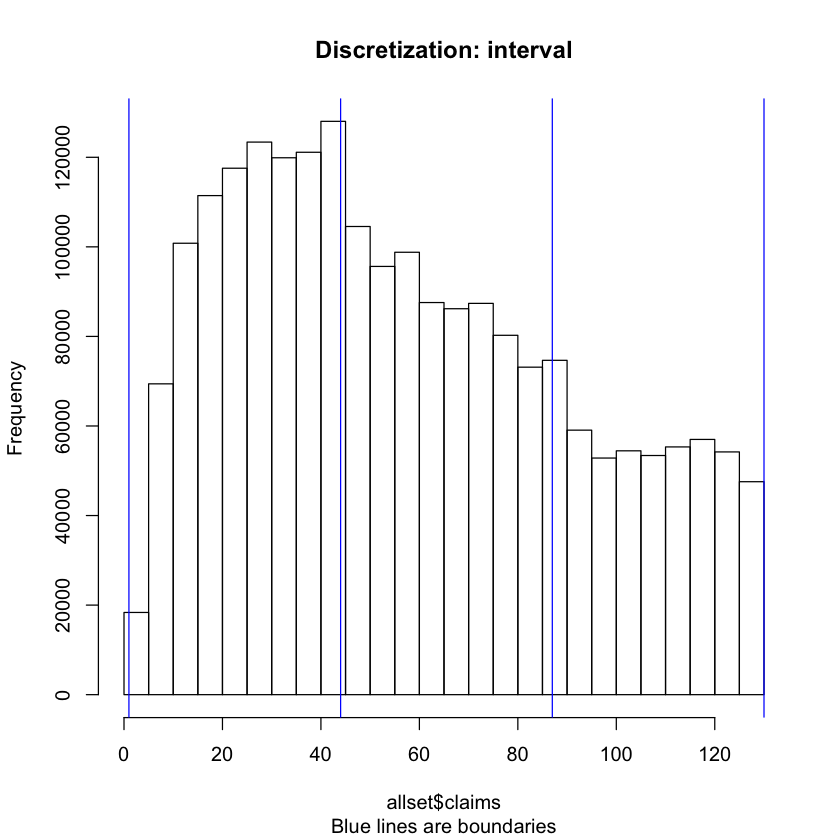

In [189]:
library(arules)
hist(allset$claims,
  main = "Discretization: interval", sub = "Blue lines are boundaries")
abline(v=discretize(allset$claims, method="interval",
  categories=3,onlycuts=TRUE), col="blue")

Warning message in discretize(allset$claims, method = "frequency", categories = 3, :
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”

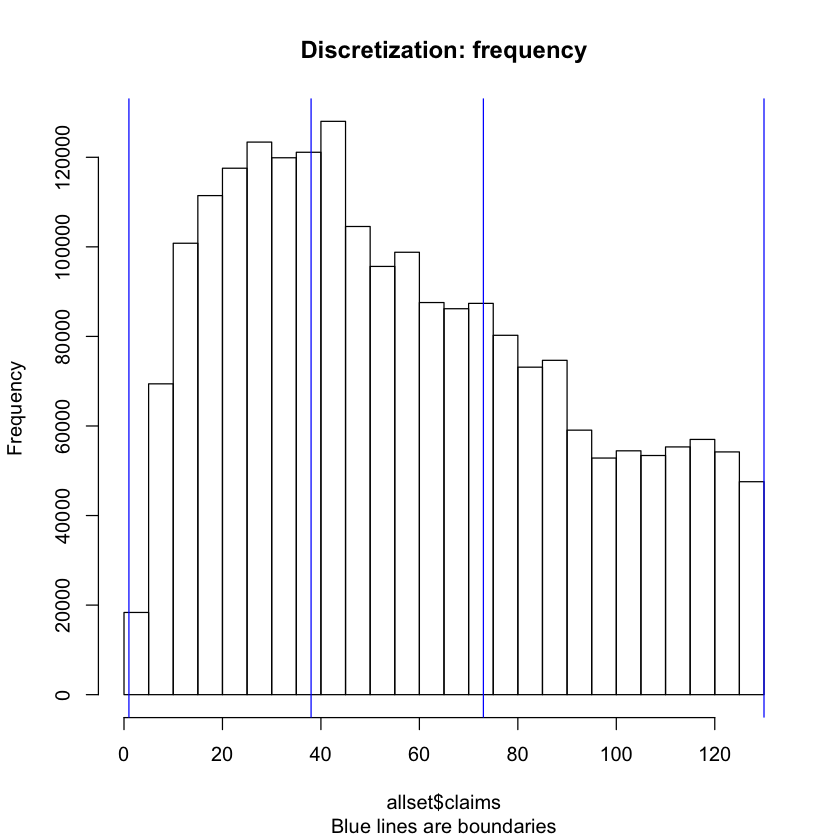

In [190]:
hist(allset$claims,
  main = "Discretization: frequency", sub = "Blue lines are boundaries")
abline(v=discretize(allset$claims, method="frequency",
  categories=3,onlycuts=TRUE), col="blue")

Warning message in discretize(allset$claims, method = "cluster", categories = 3, :
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”

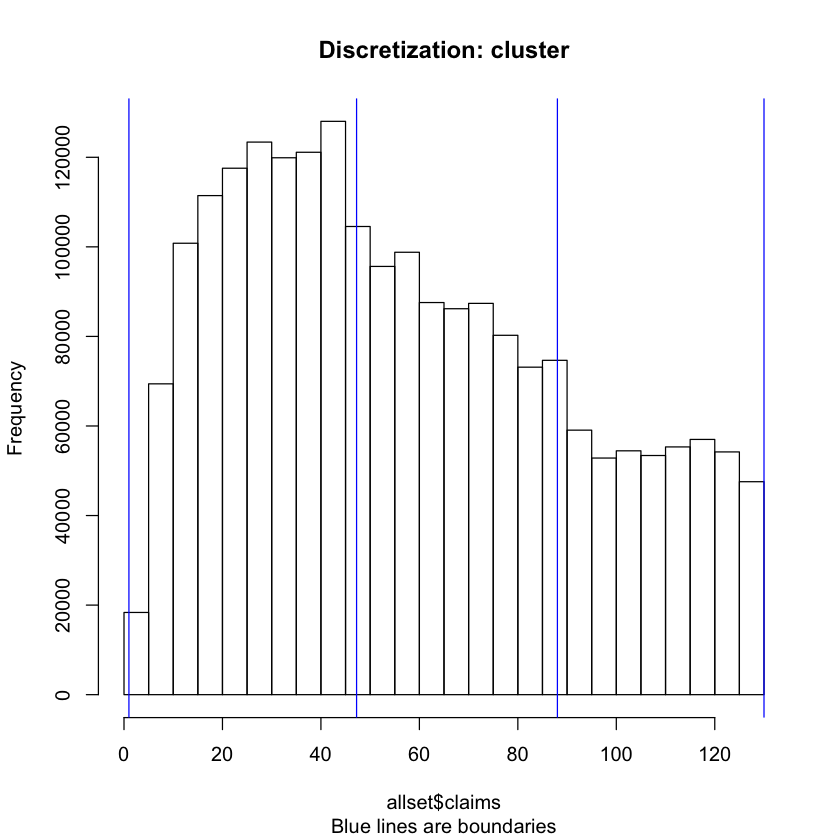

In [191]:
hist(allset$claims,
  main = "Discretization: cluster", sub = "Blue lines are boundaries")
abline(v=discretize(allset$claims, method="cluster",
  categories=3,onlycuts=TRUE), col="blue")

## Number of DrugCount

Warning message in discretize(allset$DrugCount, method = "interval", categories = 3, :
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”

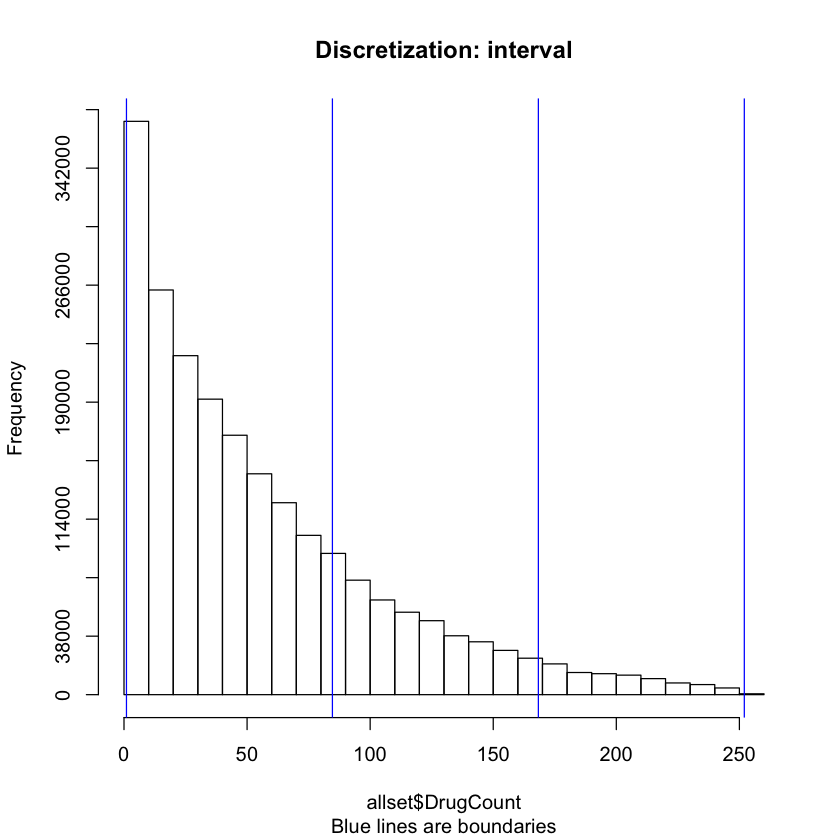

Warning message in discretize(allset$DrugCount, method = "frequency", categories = 3, :
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”

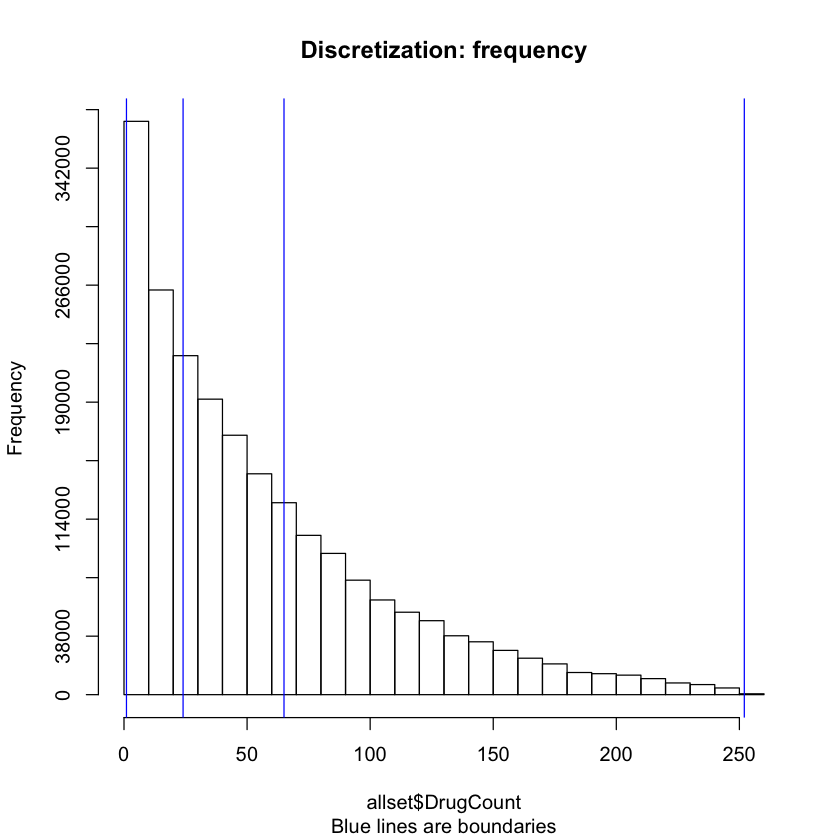

Warning message in discretize(allset$DrugCount, method = "cluster", categories = 3, :
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”

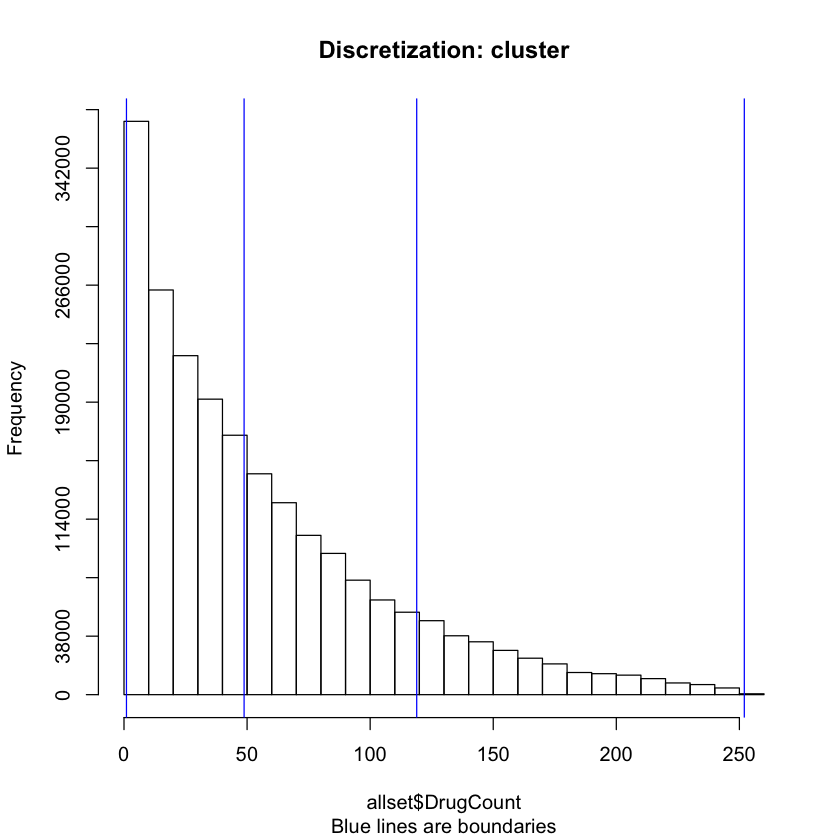

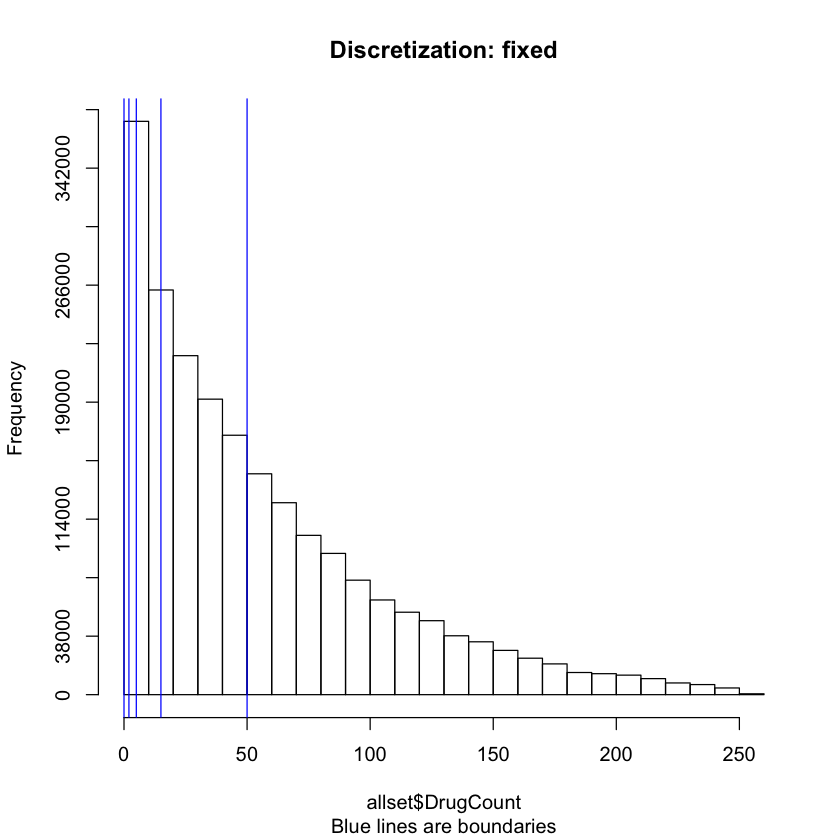

In [340]:
library(arules)
hist(allset$DrugCount,
  main = "Discretization: interval", yaxp=c(0, 380000, 10), sub = "Blue lines are boundaries")
abline(v=discretize(allset$DrugCount, method="interval",
  categories=3,onlycuts=TRUE), col="blue")

hist(allset$DrugCount,
  main = "Discretization: frequency", yaxp=c(0, 380000, 10), sub = "Blue lines are boundaries")
abline(v=discretize(allset$DrugCount, method="frequency",
  categories=3,onlycuts=TRUE), col="blue")

hist(allset$DrugCount,
  main = "Discretization: cluster", yaxp=c(0, 380000, 10), sub = "Blue lines are boundaries")
abline(v=discretize(allset$DrugCount, method="cluster",
  categories=3,onlycuts=TRUE), col="blue")

# membersY1$DaysInHospital <- discretize(membersY1$DaysInHospital, 
#   method = "fixed", breaks = c(0,1,5,Inf))
hist(allset$DrugCount,
  main = "Discretization: fixed", yaxp=c(0, 380000, 10), sub = "Blue lines are boundaries")
abline(v=discretize(allset$DrugCount, method = "fixed", breaks = c(0,2,5,15,50,Inf),onlycuts=TRUE), col="blue")

## Number of LabCount

Warning message in discretize(allset$LabCount, method = "interval", categories = 3, :
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”

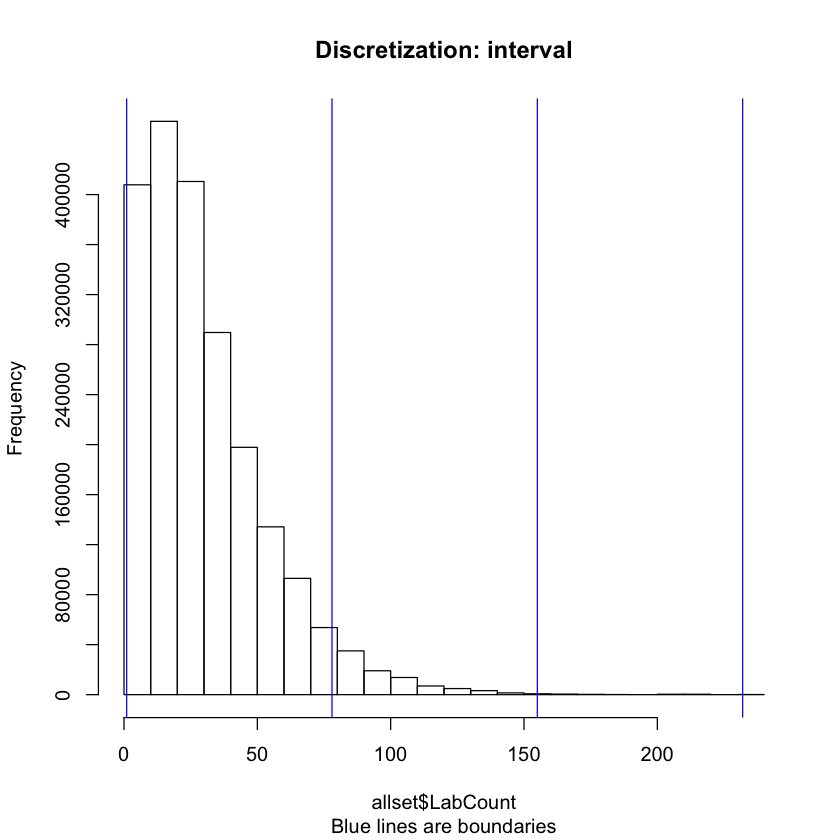

Warning message in discretize(allset$LabCount, method = "frequency", categories = 3, :
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”

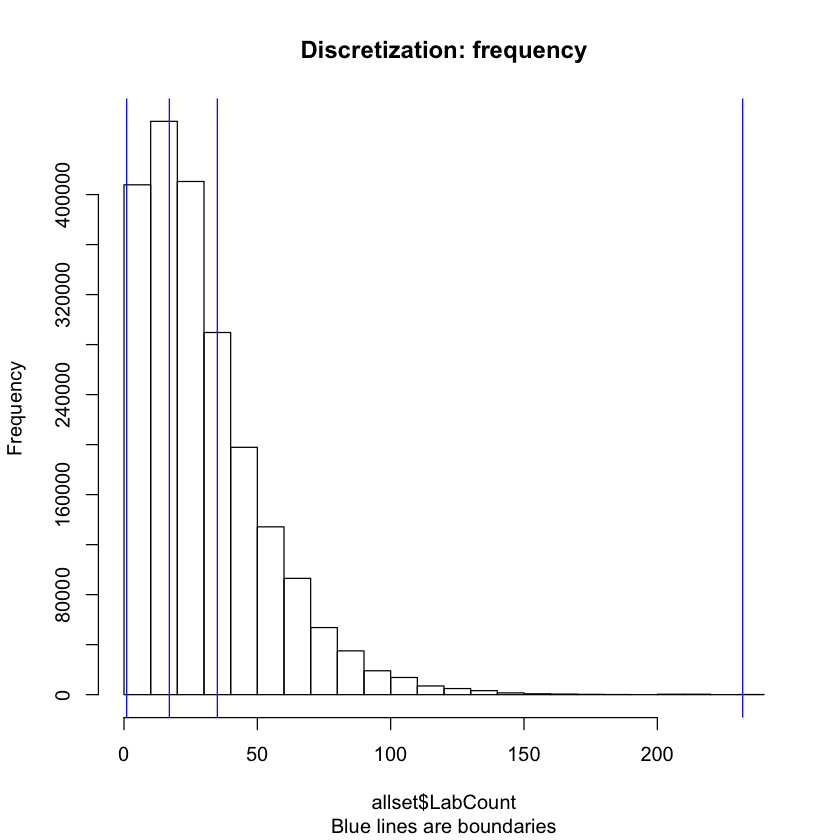

Warning message in discretize(allset$LabCount, method = "cluster", categories = 3, :
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”

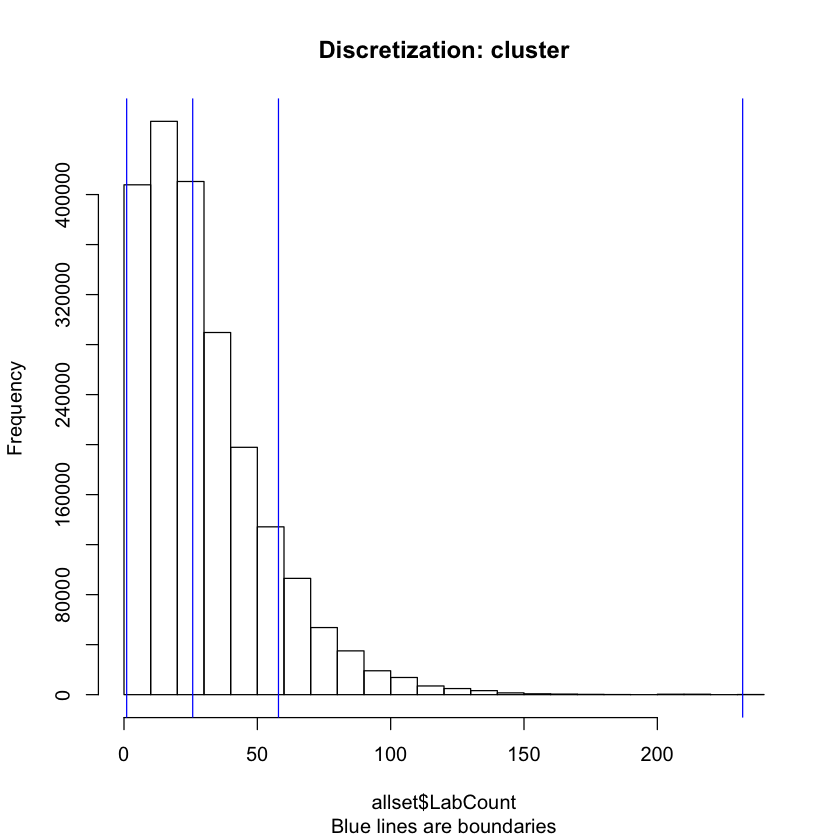

In [321]:
library(arules)
hist(allset$LabCount,
  main = "Discretization: interval", yaxp=c(0, 400000, 10), sub = "Blue lines are boundaries")
abline(v=discretize(allset$LabCount, method="interval",
  categories=3,onlycuts=TRUE), col="blue")

hist(allset$LabCount,
  main = "Discretization: frequency", yaxp=c(0, 400000, 10), sub = "Blue lines are boundaries")
abline(v=discretize(allset$LabCount, method="frequency",
  categories=3,onlycuts=TRUE), col="blue")

hist(allset$LabCount,
  main = "Discretization: cluster", yaxp=c(0, 400000, 10), sub = "Blue lines are boundaries")
abline(v=discretize(allset$LabCount, method="cluster",
  categories=3,onlycuts=TRUE), col="blue")

# hist(allset$DrugCount,
#   main = "Discretization: fixed", yaxp=c(0, 380000, 10), sub = "Blue lines are boundaries")
# abline(v=discretize(allset$DrugCount, method = "fixed", breaks = c(0,2,5,15,50,Inf),onlycuts=TRUE), col="blue")

In [341]:
allsetdis<- allset
allsetdis$claims <- discretize(allset$claims, method="cluster", categories=3)
allsetdis$DrugCount <- discretize(allset$DrugCount, method = "fixed", breaks = c(0,2,5,15,50,Inf))
allsetdis$LabCount <- discretize(allset$LabCount, method="frequency", categories=3)
summary(allsetdis)
save(allsetdis, file="all_clean.rds")

Warning message in discretize(allset$claims, method = "cluster", categories = 3):
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”Warning message in discretize(allset$LabCount, method = "frequency", categories = 3):
“Parameter categories is deprecated. Use breaks instead! Also, the default method is now frequency!”

 Year            LengthOfStay     PrimaryConditionGroup CharlsonIndex
 Y1:691306   No Stay   :2078949   MSC2a3  :394598       0  : 969089  
 Y2:723928   1 day     :  42059   METAB3  :277345       1-2:1111733  
 Y3:716760   2 days    :   4510   ARTHSPIN:228546       3-4:  45834  
             3 days    :   2426   NEUMENT :139578       5+ :   5338  
             4 days    :   1126   MISCHRT :114688                    
             1- 2 weeks:    941   RESPR4  : 98031                    
             (Other)   :   1983   (Other) :879208                    
       claims           LabCount         DrugCount      AgeAtFirstClaim 
 [1,43.9) :862305   [1,17)  :682064   [0,2)   : 45292   70-79  :618363  
 [43.9,84):732974   [17,35) :723556   [2,5)   :127952   60-69  :356319  
 [84,130] :536715   [35,232]:726374   [5,15)  :310832   80+    :310450  
                                      [15,50) :717067   50-59  :205938  
                                      [50,Inf]:930851   40-49  :178387  
  

# Modeling

In [323]:
trans <- as(allsetdis, "transactions")
summary(trans)

transactions as itemMatrix in sparse format with
 2131994 rows (elements/itemsets/transactions) and
 84 columns (items) and a density of 0.1023842 

most frequent items:
LengthOfStay=No Stay    CharlsonIndex=1-2      CharlsonIndex=0 
             2078949              1111733               969089 
     claims=[1,47.2)                Sex=F              (Other) 
              954099               890428             12331432 

element (itemset/transaction) length distribution:
sizes
      7       8       9 
 126477  599262 1406255 

   Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
    7.0     8.0     9.0     8.6     9.0     9.0 

includes extended item information - examples:
   labels variables levels
1 Year=Y1      Year     Y1
2 Year=Y2      Year     Y2
3 Year=Y3      Year     Y3

includes extended transaction information - examples:
  transactionID
1             1
2             2
3             3

## Frequent Transaction Selection

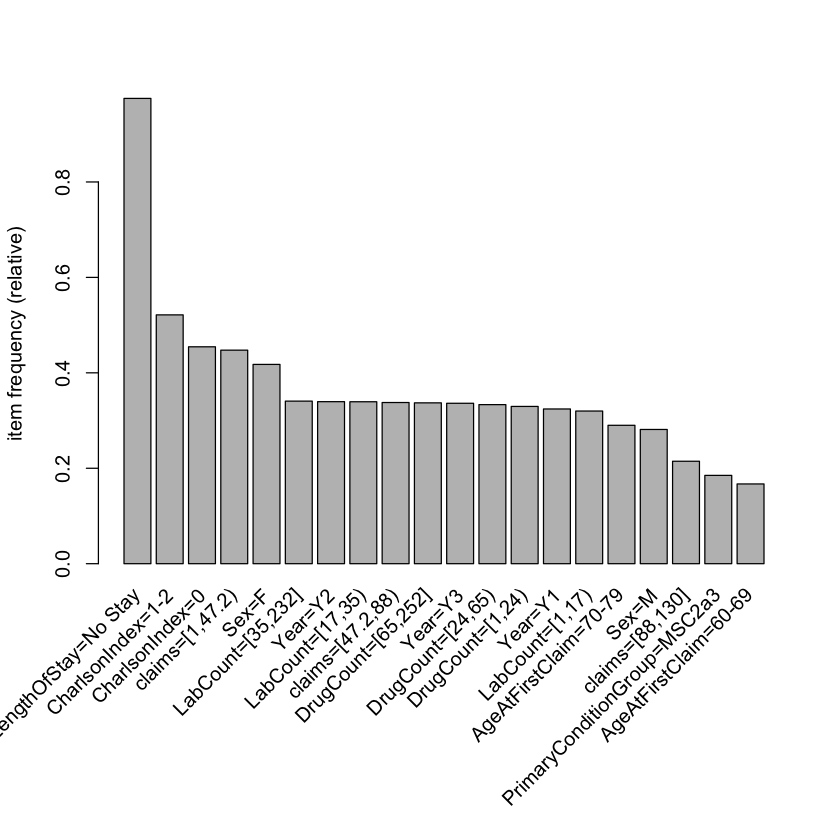

In [324]:
itemFrequencyPlot(trans, topN = 20)

transactions in sparse format with
 6 transactions (rows) and
 77 items (columns)

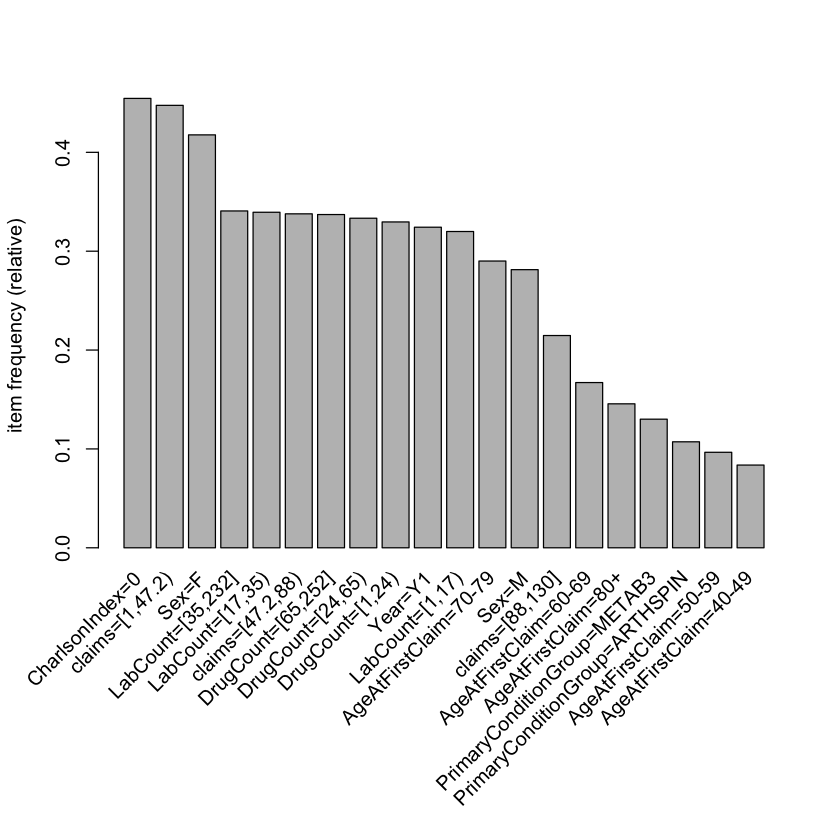

In [325]:
# trans1 <- trans[,-grep("^InHospital=|CharlsonIndex=0|DaysInHospital=\\[0,1)", 
#   itemLabels(trans))]
trans1 <- trans[,-grep("^Year=Y2|Year=Y3|LengthOfStay=No Stay|PrimaryConditionGroup=MSC2a3|PrimaryConditionGroup=MSCCL1|PrimaryConditionGroup=MSCCL5|CharlsonIndex=1-2|CharlsonIndex=3-4|CharlsonIndex=5+", 
  itemLabels(trans))]

head(trans1)

itemFrequencyPlot(trans1, topN = 20)


## Mining Rules

In [326]:
# nrow(trans1)
100/nrow(trans1)
rules <- apriori(trans1, parameter = list(supp = 0.0000469))
# rules <- apriori(trans1, parameter = list(supp = 0.1))
# rules <- apriori(trans1, parameter = list(supp = 0.01, confidence=0.8))

[1] 4.690445e-05

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime  support minlen
        0.8    0.1    1 none FALSE            TRUE       5 4.69e-05      1
 maxlen target   ext
     10  rules FALSE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 99 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[77 item(s), 2131994 transaction(s)] done [0.90s].
sorting and recoding items ... [76 item(s)] done [0.10s].
creating transaction tree ... done [2.02s].
checking subsets of size 1 2 3 4 5 6 7 8 done [0.14s].
writing ... [26760 rule(s)] done [0.01s].
creating S4 object  ... done [0.34s].


In [327]:
length(rules)
inspect(head(rules, 20, by = "lift"))

[1] 26760

     lhs                          rhs                                 support confidence      lift count
[1]  {LengthOfStay=4- 8 weeks,                                                                          
      claims=[88,130],                                                                                  
      LabCount=[35,232],                                                                                
      DrugCount=[65,252]}      => {PrimaryConditionGroup=RENAL2} 5.112585e-05  0.8861789 193.79711   109
[2]  {LengthOfStay=4- 8 weeks,                                                                          
      claims=[88,130],                                                                                  
      LabCount=[35,232]}       => {PrimaryConditionGroup=RENAL2} 8.020660e-05  0.8260870 180.65570   171
[3]  {LengthOfStay=4- 8 weeks,                                                                          
      LabCount=[35,232],                               

In [328]:
library(arulesViz)
library(grid)
library(shiny)

p <- inspectDT(rules)
htmlwidgets::saveWidget(p, "arules.html", selfcontained = FALSE)
browseURL("arules.html")


Warning message in instance$preRenderHook(instance):
“It seems your data is too big for client-side DataTables. You may consider server-side processing: https://rstudio.github.io/DT/server.html”

In [257]:
plot(rules, engine = "html")

Warning message:
“plot: Too many rules supplied. Only plotting the best 1000 rules using measure lift (change parameter max if needed)”To reduce overplotting, jitter is added! Use jitter = 0 to prevent jitter.


HTML widgets cannot be represented in plain text (need html)

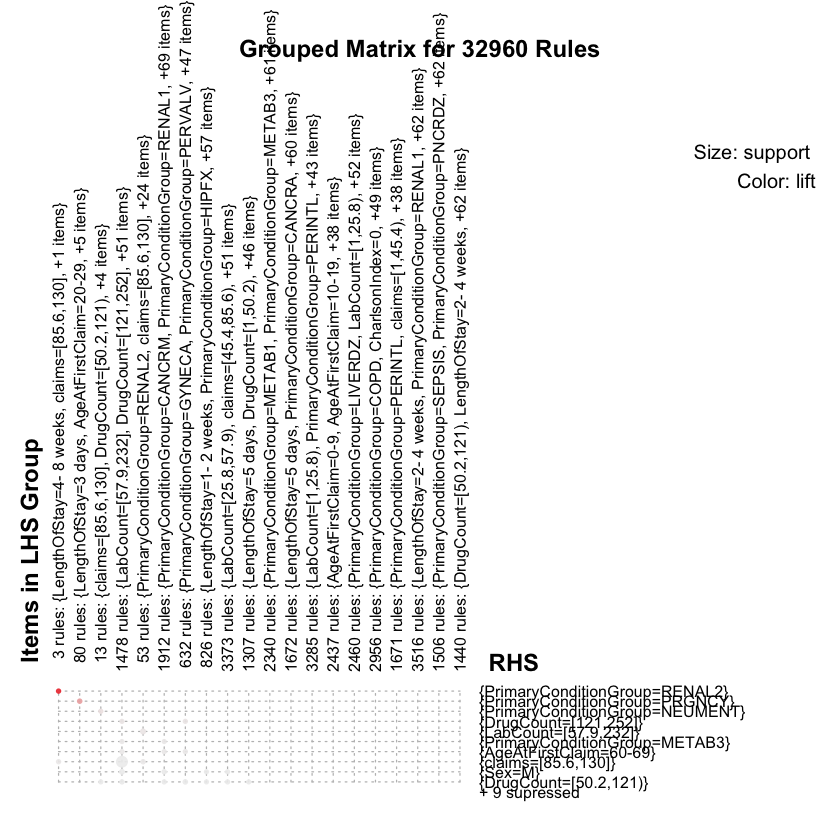

In [258]:
plot(rules, method="grouped")

In [318]:
# plot(rules, method = "graph", engine = "html")

# Exceptional Work
## ROAMI

In [342]:
summary(allsetdis)

 Year            LengthOfStay     PrimaryConditionGroup CharlsonIndex
 Y1:691306   No Stay   :2078949   MSC2a3  :394598       0  : 969089  
 Y2:723928   1 day     :  42059   METAB3  :277345       1-2:1111733  
 Y3:716760   2 days    :   4510   ARTHSPIN:228546       3-4:  45834  
             3 days    :   2426   NEUMENT :139578       5+ :   5338  
             4 days    :   1126   MISCHRT :114688                    
             1- 2 weeks:    941   RESPR4  : 98031                    
             (Other)   :   1983   (Other) :879208                    
       claims           LabCount         DrugCount      AgeAtFirstClaim 
 [1,43.9) :862305   [1,17)  :682064   [0,2)   : 45292   70-79  :618363  
 [43.9,84):732974   [17,35) :723556   [2,5)   :127952   60-69  :356319  
 [84,130] :536715   [35,232]:726374   [5,15)  :310832   80+    :310450  
                                      [15,50) :717067   50-59  :205938  
                                      [50,Inf]:930851   40-49  :178387  
  

 Year          LengthOfStay  PrimaryConditionGroup CharlsonIndex
 Y1:2496   2 days    :3387   PRGNCY :1114          0  :3293     
 Y2:2633   3 days    :1774          : 922          1-2:4167     
 Y3:2562   4 days    : 814   ROAMI  : 565          3-4: 199     
           4- 8 weeks: 488   AMI    : 559          5+ :  32     
           1- 2 weeks: 478   APPCHOL: 554                       
           2- 4 weeks: 338   RENAL2 : 508                       
           (Other)   : 412   (Other):3469                       
       claims         LabCount       DrugCount    AgeAtFirstClaim   Sex      
 [1,43.9) :3217   [1,17)  :2976   [0,2)   : 205   70-79  :1650    F   :2081  
 [43.9,84):3077   [17,35) :2812   [2,5)   : 633   80+    :1006    M   : 826  
 [84,130] :1397   [35,232]:1903   [5,15)  :1398   60-69  : 772    NA's:4784  
                                  [15,50) :2522   30-39  : 694               
                                  [50,Inf]:2933   20-29  : 614               
            

 PrimaryConditionGroup     LengthOfStay     DrugCount    AgeAtFirstClaim
 PRGNCY :1114          2 days    :3387   [0,2)   : 205   70-79  :1650   
        : 922          3 days    :1774   [2,5)   : 633   80+    :1006   
 ROAMI  : 565          4 days    : 814   [5,15)  :1398   60-69  : 772   
 AMI    : 559          4- 8 weeks: 488   [15,50) :2522   30-39  : 694   
 APPCHOL: 554          1- 2 weeks: 478   [50,Inf]:2933   20-29  : 614   
 RENAL2 : 508          2- 4 weeks: 338                   (Other):1069   
 (Other):3469          (Other)   : 412                   NA's   :1886   
   Sex      
 F   :2081  
 M   : 826  
 NA's:4784  
            
            
            
            

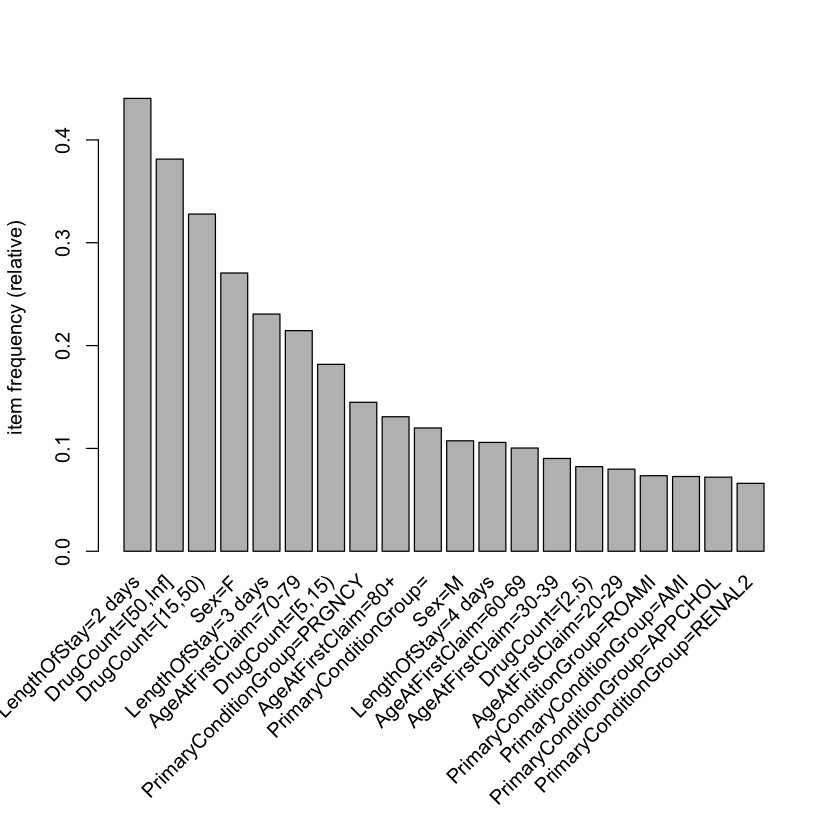

In [454]:
# allsetY1 <- allsetdis[allsetdis$LengthOfStay!="No Stay" & allsetdis$LengthOfStay!="1 day" &
#                       (allsetdis$PrimaryConditionGroup=="ARTHSPIN"|
#                        allsetdis$PrimaryConditionGroup=="RESPR4"|
#                        allsetdis$PrimaryConditionGroup=="SKNAUT"|
#                        allsetdis$PrimaryConditionGroup=="GIBLEED"),] 

allsetY1 <- allsetdis[allsetdis$LengthOfStay!="No Stay" & allsetdis$LengthOfStay!="1 day" &
                      (allsetdis$PrimaryConditionGroup!="ARTHSPIN"&
                       allsetdis$PrimaryConditionGroup!="GIBLEED"&
                       allsetdis$PrimaryConditionGroup!="INFEC4"&
                       allsetdis$PrimaryConditionGroup!="METAB3"&
                       allsetdis$PrimaryConditionGroup!="MSCHRT"&
                       allsetdis$PrimaryConditionGroup!="MSC2a3"&
                       allsetdis$PrimaryConditionGroup!="NEUMENT"&
                       allsetdis$PrimaryConditionGroup!="RESPR4"&
                       allsetdis$PrimaryConditionGroup!="SKNAUT"),] 
summary(allsetY1)
allsetY1 <- subset(allsetY1, select=c(PrimaryConditionGroup, LengthOfStay, DrugCount, AgeAtFirstClaim, Sex))
# allsetY1 <- subset(allsetY1, select=c(LengthOfStay, AgeAtFirstClaim, Sex))
summary(allsetY1)
# transROMraw <- as(allsetY1, "transactions")
transROM <- as(allsetY1, "transactions")
# itemFrequencyPlot(transROMraw, topN = 20)
# transROM <- transROMraw[,-grep("^LengthOfStay=No Stay", 
#   itemLabels(transROMraw))]
itemFrequencyPlot(transROM, topN = 20)


In [455]:
100/nrow(transROM)
length(transROM)
rulesROM <- apriori(transROM, parameter = list(supp = 0.013))
# inspect(head(rulesROM, 20, by = "lift"))
p <- inspectDT(rulesROM)
htmlwidgets::saveWidget(p, "arules.html", selfcontained = FALSE)
browseURL("arules.html")


[1] 0.01300221

[1] 7691

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
        0.8    0.1    1 none FALSE            TRUE       5   0.013      1
 maxlen target   ext
     10  rules FALSE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 99 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[58 item(s), 7691 transaction(s)] done [0.00s].
sorting and recoding items ... [44 item(s)] done [0.00s].
creating transaction tree ... done [0.00s].
checking subsets of size 1 2 3 4 done [0.00s].
writing ... [22 rule(s)] done [0.00s].
creating S4 object  ... done [0.00s].


To reduce overplotting, jitter is added! Use jitter = 0 to prevent jitter.


HTML widgets cannot be represented in plain text (need html)

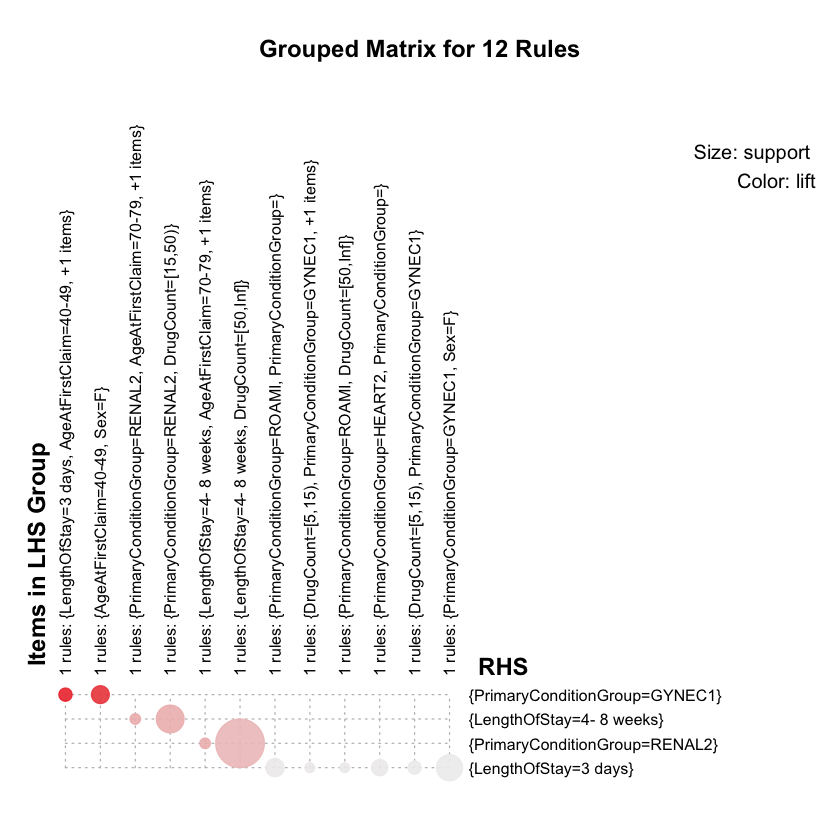

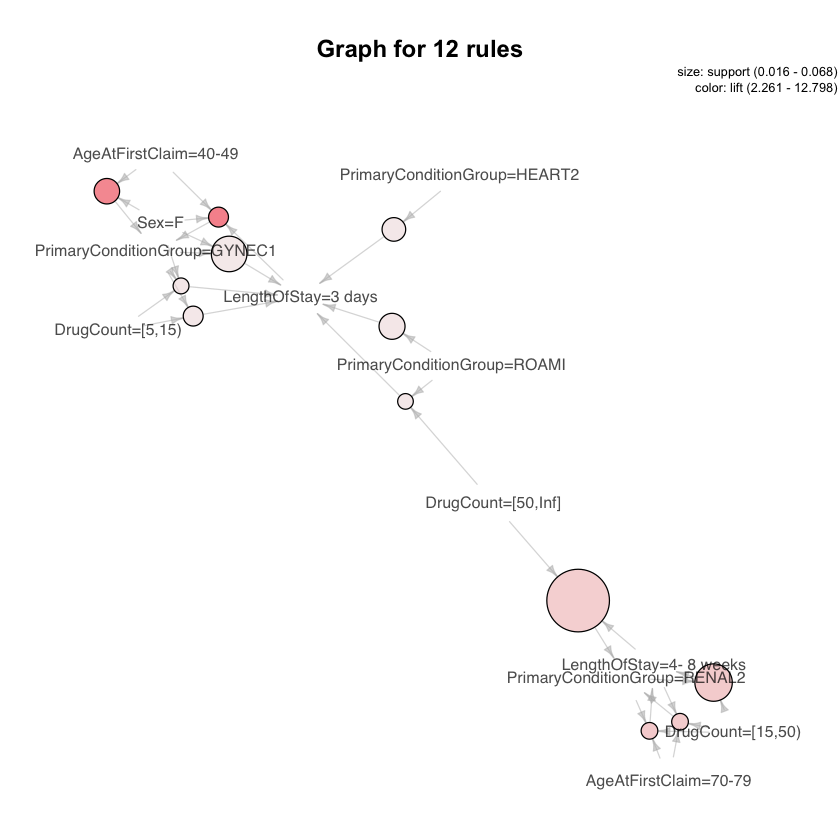

In [442]:
plot(rulesROM, engine = "html")
plot(rulesROM, method = "group")
# plot(rulesROM, method = "two-key plot")
plot(rulesROM, method = "graph", cex = 0.8)
# plot(rulesROM, method = "paracoord")


## Something Else

 Year         LengthOfStay PrimaryConditionGroup CharlsonIndex       claims   
 Y1:514   2 days    :758   ARTHSPIN:982          0  :919       [1,43.9) :581  
 Y2:607   3 days    :481   GIBLEED :641          1-2:918       [43.9,84):883  
 Y3:743   4 days    :205   RESPR4  :126          3-4: 27       [84,130] :400  
          1- 2 weeks:181   SKNAUT  :115          5+ :  0                      
          2- 4 weeks:108           :  0                                       
          4- 8 weeks: 77   AMI     :  0                                       
          (Other)   : 54   (Other) :  0                                       
     LabCount      DrugCount   AgeAtFirstClaim   Sex      
 [1,17)  :692   [0,2)   : 33   70-79  :549     F   : 407  
 [17,35) :772   [2,5)   :100   80+    :305     M   : 203  
 [35,232]:400   [5,15)  :337   60-69  :238     NA's:1254  
                [15,50) :677   50-59  :109                
                [50,Inf]:717   40-49  :102                
              

 PrimaryConditionGroup     LengthOfStay    DrugCount   AgeAtFirstClaim
 ARTHSPIN:982          2 days    :758   [0,2)   : 33   70-79  :549    
 GIBLEED :641          3 days    :481   [2,5)   :100   80+    :305    
 RESPR4  :126          4 days    :205   [5,15)  :337   60-69  :238    
 SKNAUT  :115          1- 2 weeks:181   [15,50) :677   50-59  :109    
         :  0          2- 4 weeks:108   [50,Inf]:717   40-49  :102    
 AMI     :  0          4- 8 weeks: 77                  (Other):154    
 (Other) :  0          (Other)   : 54                  NA's   :407    
   Sex      
 F   : 407  
 M   : 203  
 NA's:1254  
            
            
            
            

[1] 0.05364807

[1] 1864

Apriori

Parameter specification:
 confidence minval smax arem  aval originalSupport maxtime support minlen
        0.8    0.1    1 none FALSE            TRUE       5   0.013      1
 maxlen target   ext
     10  rules FALSE

Algorithmic control:
 filter tree heap memopt load sort verbose
    0.1 TRUE TRUE  FALSE TRUE    2    TRUE

Absolute minimum support count: 24 

set item appearances ...[0 item(s)] done [0.00s].
set transactions ...[28 item(s), 1864 transaction(s)] done [0.00s].
sorting and recoding items ... [26 item(s)] done [0.00s].
creating transaction tree ... done [0.00s].
checking subsets of size 1 2 3 4 5 done [0.00s].
writing ... [40 rule(s)] done [0.00s].
creating S4 object  ... done [0.00s].


HTML widgets cannot be represented in plain text (need html)

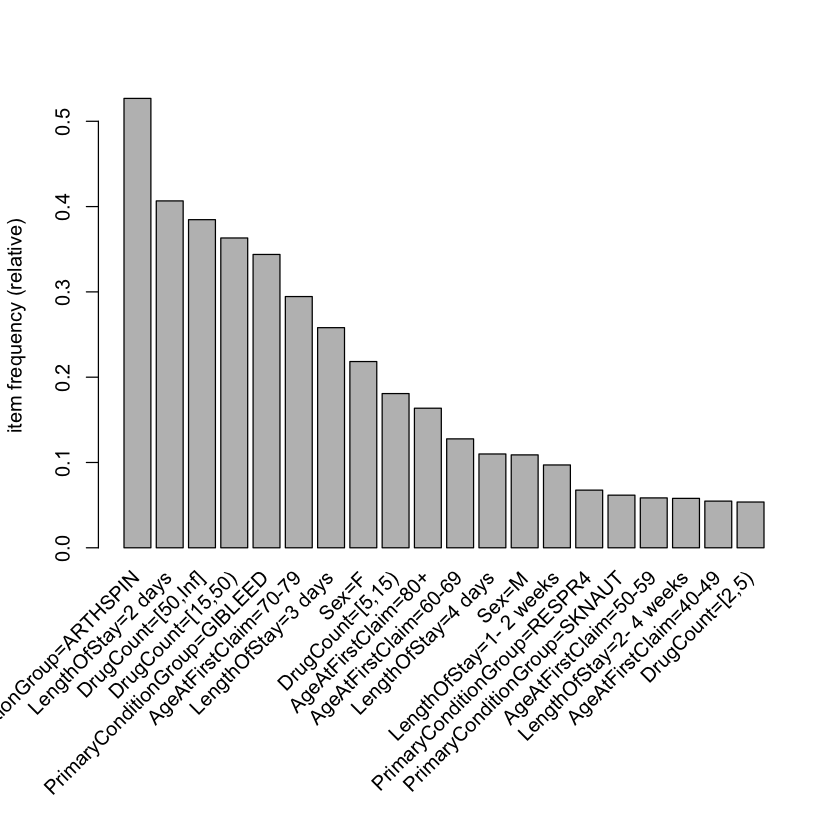

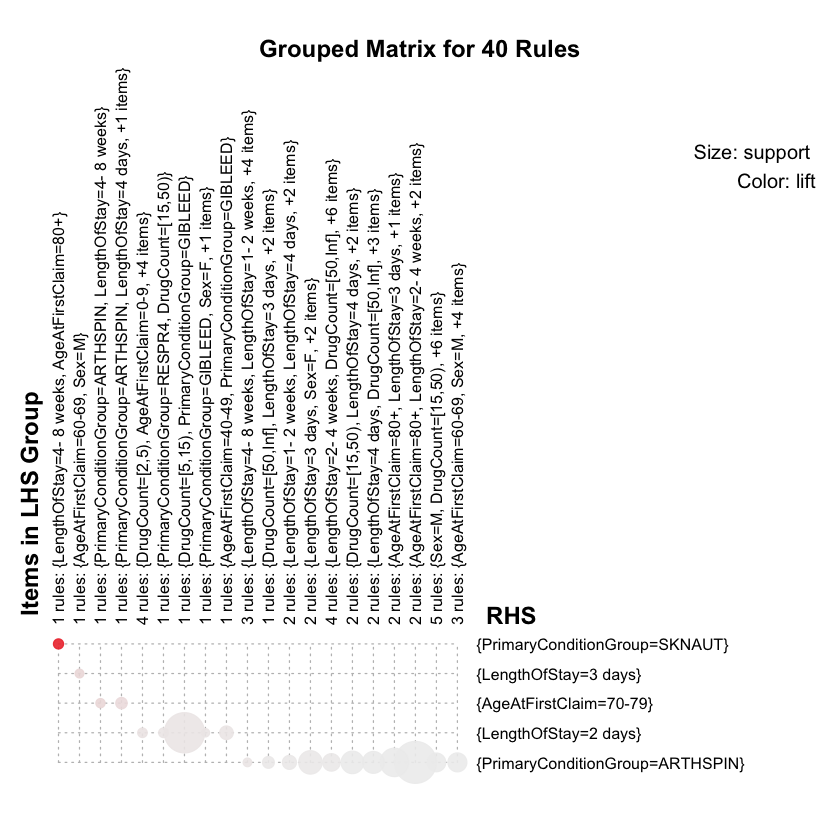

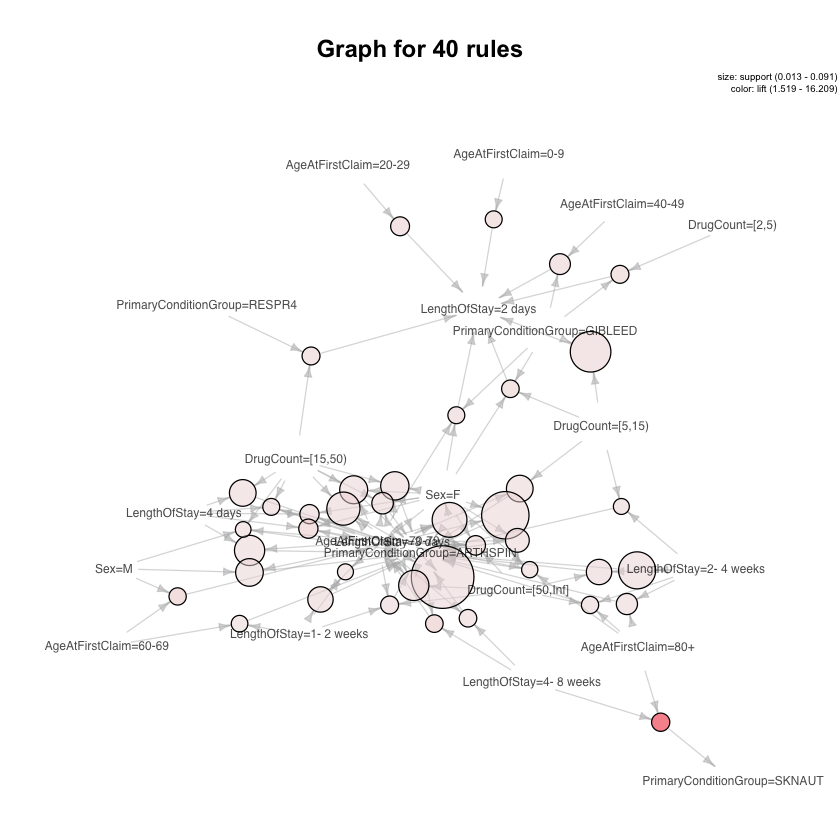

In [449]:
allsetY1 <- allsetdis[allsetdis$LengthOfStay!="No Stay" & allsetdis$LengthOfStay!="1 day" &
                      (allsetdis$PrimaryConditionGroup=="ARTHSPIN"|
                       allsetdis$PrimaryConditionGroup=="RESPR4"|
                       allsetdis$PrimaryConditionGroup=="SKNAUT"|
                       allsetdis$PrimaryConditionGroup=="GIBLEED"),] 

# allsetY1 <- allsetdis[allsetdis$LengthOfStay!="No Stay" & allsetdis$LengthOfStay!="1 day" &
#                       (allsetdis$PrimaryConditionGroup=="ROAMI" | allsetdis$PrimaryConditionGroup=="AMI"),] 
summary(allsetY1)
allsetY1 <- subset(allsetY1, select=c(PrimaryConditionGroup, LengthOfStay, DrugCount, AgeAtFirstClaim, Sex))
# allsetY1 <- subset(allsetY1, select=c(LengthOfStay, AgeAtFirstClaim, Sex))
summary(allsetY1)
# transROMraw <- as(allsetY1, "transactions")
transROM <- as(allsetY1, "transactions")
# itemFrequencyPlot(transROMraw, topN = 20)
# transROM <- transROMraw[,-grep("^LengthOfStay=No Stay", 
#   itemLabels(transROMraw))]
itemFrequencyPlot(transROM, topN = 20)

100/nrow(transROM)
length(transROM)
rulesROM <- apriori(transROM, parameter = list(supp = 0.013))
# inspect(head(rulesROM, 20, by = "lift"))
p <- inspectDT(rulesROM)
htmlwidgets::saveWidget(p, "arules.html", selfcontained = FALSE)
browseURL("arules.html")

plot(rulesROM, engine = "html")
plot(rulesROM, method = "group")
# plot(rulesROM, method = "two-key plot")
plot(rulesROM, method = "graph", cex = 0.6)
# plot(rulesROM, method = "paracoord")